# 1) Split Audios into 5 second files

WAV File Segmentation Script

This script reads a long WAV file, divides it into segments of a specified duration, and saves each segment as a new WAV file.

Parameters:
- input_wav_file (str): The path to the input WAV file that you want to split.
- output_direct (str): The directory where the output segments will be saved.
- segment_duration (int): The desired duration of each segment in seconds.

Usage:
1. Provide the path to the input WAV file you want to split in the 'input_wav_file' variable.
2. Specify the output directory in the 'output_direct' variable where the segmented files will be saved.
3. Set the 'segment_duration' variable to the desired duration of each segment in seconds.
4. Run the script to perform the segmentation.

Note: Make sure you have the necessary libraries installed, such as 'scipy' for WAV file operations.

In [ ]:
from scipy.io import wavfile
import numpy as np

# Path to the 6-minute WAV file you want to split.
input_wav_file = '/Users/cabral/Voices/Andres_Audio.wav'
output_direct = "/Users/cabral/voices_dataset/Andres/"

# Desired duration of each segment in seconds.
segment_duration = 5

# Read the input WAV file.
sample_rate, wav_data = wavfile.read(input_wav_file)

# Calculate the total duration of the WAV file in seconds.
total_duration = len(wav_data) / sample_rate

# Calculate the number of segments needed.
num_segments = int(total_duration / segment_duration)

# Create and save individual segments.
for i in range(num_segments):
    # Calculate the start and end points for each segment.
    start_time = i * segment_duration
    end_time = (i + 1) * segment_duration

    # Calculate the corresponding sample indices.
    start_sample = int(start_time * sample_rate)
    end_sample = int(end_time * sample_rate)

    # Extract the segment from the WAV data.
    segment = wav_data[start_sample:end_sample]

    # Define the output filename for the segment (you can customize this).
    output_wav_file = f'output_segment_{i + 1}.wav'

    # Save the segment as a new WAV file.
    wavfile.write(output_direct + output_wav_file, sample_rate, segment)

    print(f'Saved {output_wav_file}')

print("Segmentation complete.")

# 2) Load Pre-trained Model

This code imports necessary modules and sets the seed value for reproducibility in an audio processing project using TensorFlow.

Modules Imported:
- os: Provides operating system-related functions.
- pathlib: Provides classes for working with file paths.
- soundfile (sf): A library for reading and writing audio files.
- matplotlib.pyplot (plt): A library for creating data visualizations.
- numpy (np): A library for numerical computations.
- seaborn (sns): A library for data visualization based on matplotlib.
- tensorflow (tf): An open-source machine learning framework.

Environment Configuration:
- Sets the seed value for experiment reproducibility using TensorFlow and NumPy.

Usage:
1. Import this code snippet at the beginning of your audio processing project to set up the required modules and seed value for reproducibility.

Note: You should adjust the seed value to suit your specific project and experimentation needs.

In [1]:
import os
import pathlib
import soundfile as sf  # For saving the mono audio


import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import tensorflow as tf

from tensorflow.keras import layers
from tensorflow.keras import models
from IPython import display

# Set the seed value for experiment reproducibility.
seed = 42
tf.random.set_seed(seed)
np.random.seed(seed)

### Importing the Mini Speech Commands Dataset

This code snippet is used to import the Mini Speech Commands dataset and set the path to the dataset directory.

Parameters:
- DATASET_PATH (str): The path to the directory where the Mini Speech Commands dataset is located.

Usage:
1. Set the `DATASET_PATH` variable to the path where you have stored the Mini Speech Commands dataset on your local system.
2. Import this code snippet in your audio classification project to load the dataset.

Note: Ensure that you have downloaded and stored the Mini Speech Commands dataset in the specified directory.

In [2]:
#Import the mini Speech Commands dataset
DATASET_PATH = "/Users/cabral/voices_dataset"
data_dir = pathlib.Path(DATASET_PATH)

### Print the Folders of Commands in the Dataset

This code snippet prints the names of the folders (commands) present in the Mini Speech Commands dataset.

Parameters:
- commands (array): An array containing the names of the folders representing different voice commands in the dataset.

Usage:
1. Import this code snippet after loading the Mini Speech Commands dataset.
2. It prints the names of the folders (commands) in the dataset.

This code will display the list of voice commands found in the dataset.

Note: Make sure you have already imported the Mini Speech Commands dataset and set the data_dir variable as shown in the previous code snippet.

In [3]:
# Print the folders of the commands in the data set
commands = np.array(tf.io.gfile.listdir(str(data_dir)))
commands = commands[(commands != 'README.md') & (commands != '.DS_Store')]
print('Commands:', commands)

Commands: ['Andres' 'David' 'Fernando']


### Creating Audio Datasets and Labels for Validation

This code snippet organizes the dataset into directories and prepares a validation dataset using `tf.keras.utils.audio_dataset_from_directory`. It also prints the label names.

Parameters:
- directory (str): The path of the dataset directory.
- batch_size (int): The batch size for the dataset.
- seed (int): The seed value for randomization.
- output_sequence_length (int): The desired sequence length for audio data.

Usage:
1. Import this code snippet to create audio datasets and labels for validation.
2. Set the `directory` to the path of your dataset.
3. Configure the `batch_size`, `seed`, and `output_sequence_length` according to your project requirements.

This code sets up a validation dataset for audio classification.

Note: Adjust the parameters to match the specifics of your dataset and project.

In [4]:
# Divided into directories this way, you can easily load the data using:
# keras.utils.audio_dataset_from_directory.

#There is only validation data because we dont train the model
# Audios are of 5 seconds, so they are 44.1 kHz, which means that every second 44,100 samples were taken


val_ds = tf.keras.utils.audio_dataset_from_directory(
    directory=data_dir,#Path of dataset
    batch_size=64,
    seed=42,
    output_sequence_length=220500,
)

label_names = np.array(val_ds.class_names)
print()
print("label names:", label_names)



Found 1081 files belonging to 3 classes.

label names: ['Andres' 'David' 'Fernando']


### Verifying the Length of Audio Samples

This code snippet verifies the length of audio samples in the validation dataset.

Parameters:
- val_ds (tf.data.Dataset): The validation dataset containing audio samples.
- audio_sample (numpy.ndarray): A single audio sample from the dataset.

Usage:
1. Import this code snippet to verify the length of audio samples in the validation dataset.
2. Ensure that you have already created the validation dataset (val_ds) as described in the previous code snippet.
3. The code takes a single audio sample from the dataset and calculates its duration in seconds.

This code calculates and displays the duration of a single audio sample in seconds.

Note: Adjust the batch size and dataset according to your specific project.

In [5]:
#Verify the length of the audios
for audio, labels in val_ds.take(1):
    audio_sample = audio[0]  # Assuming batch_size is 1
    
audio_sample_duration = len(audio_sample) / 44100
print("Lenght of audio: ") 
print(audio_sample_duration)

Lenght of audio: 
5.0


### Checking the Number of Audio Channels

This code snippet checks and prints the number of audio channels in the audio samples of the validation dataset.

Parameters:
- val_ds (tf.data.Dataset): The validation dataset containing audio samples.

Usage:
1. Import this code snippet to check the number of audio channels in the dataset.
2. Ensure that you have already created the validation dataset (val_ds) as described in previous code snippets.
3. The code iterates through the validation dataset and prints the number of channels in each audio sample.

This code prints the number of channels in the audio samples.

Note: Adjust the dataset and batch size according to your specific project.

In [6]:
for audio, labels in val_ds:
    print("Number of channels:", audio.shape[-1])
    break

Number of channels: 1


### Viewing the Element Specification of the Dataset

This code snippet displays the element specification (element_spec) of the dataset, which describes the expected shape and data type of elements in the dataset.

Parameters:
- val_ds (tf.data.Dataset): The validation dataset containing audio clips and labels.

Usage:
1. Import this code snippet to view the element specification of the dataset.
2. Ensure that you have created and configured the validation dataset (val_ds) as described in previous code snippets.

This code allows you to view the element specification of the dataset, which includes information about the shape and data types of the elements.

Note: The element specification is important for understanding the structure of the dataset.

In [7]:
# The dataset now contains batches of audio clips and integer labels.
# The audio clips have a shape of (batch, samples, channels).

val_ds.element_spec

(TensorSpec(shape=(None, 220500, None), dtype=tf.float32, name=None),
 TensorSpec(shape=(None,), dtype=tf.int32, name=None))

### Squeezing the Audio Data to Mono Channel

This code snippet utilizes the `tf.squeeze` function to remove the extra dimension from audio samples, ensuring that the audio data is in mono (single-channel). It also verifies the number of channels in the modified audio samples.

Parameters:
- audio (Tensor): Audio data with an extra dimension.
- labels (Tensor): Integer labels associated with the audio data.

Usage:
1. Import this code snippet to process audio data and make it mono.
2. Ensure that you have created and configured the validation dataset (val_ds) as described in previous code snippets.
3. The code maps the `squeeze` function to the dataset using `val_ds.map`, and then it verifies the number of channels in the modified audio samples.

This code ensures that the audio data in the dataset is mono.

Note: Make sure that your dataset indeed contains single-channel (mono) audio data.

In [8]:
# This dataset only contains single channel audio because its mono, so use the tf.squeeze 
# function to drop the extra axis:


def squeeze(audio, labels):
  audio = tf.squeeze(audio, axis=-1)
  return audio, labels

val_ds = val_ds.map(squeeze, tf.data.AUTOTUNE)

for audio, labels in val_ds:
    print("Number of channels:", audio.shape[-1])
    break

Number of channels: 220500


### Splitting the Validation Dataset into Two Halves

This code snippet utilizes the `shard` function to split the validation dataset into two halves. It is useful when you want to keep a test set separate from your validation set. Note that iterating over any shard will load all the data but keep only its fraction.

Parameters:
- val_ds (tf.data.Dataset): The validation dataset.
- num_shards (int): The total number of shards to create. In this case, set to 2 to create two equal halves.
- index (int): The index of the shard to select.

Usage:
1. Import this code snippet to split the validation dataset into two equal halves.
2. Ensure that you have previously configured the validation dataset (val_ds).
3. Use this code to create a separate test set from your validation set.

This code will split the validation dataset into two halves.

Note: Remember that iterating over any shard will load all the data in the selected shard but only keep its fraction. Adjust the index parameter if you want to select the second shard.

In [9]:
# The utils.audio_dataset_from_directory function only returns up to two splits. 
# It's a good idea to keep a test set separate from your validation set. 
# Ideally you'd keep it in a separate directory, but in this case you can
# use Dataset.shard to split the validation set into two halves. 
# Note that iterating over any shard will load all the data, and only keep its fraction.
    
val_ds = val_ds.shard(num_shards=2, index=0)


### Printing the Shape of Example Audio and Labels

This code snippet prints the shape of example audio samples and labels in the validation dataset after applying the shard operation.

Parameters:
- example_audio (Tensor): An example audio sample.
- example_labels (Tensor): Labels associated with the example audio.

Usage:
1. Import this code snippet to view the shape of example audio and labels.
2. Ensure that you have previously split the validation dataset using the `shard` operation.
3. The code takes an example audio and its corresponding labels and prints their shapes.

This code displays the shape of example audio and labels.

Note: The output will show the shapes of a sample audio and its associated labels.

In [10]:
for example_audio, example_labels in val_ds.take(1):  
  print(example_audio.shape)
  print(example_labels.shape)

(64, 220500)
(64,)


### Plotting Audio Waveforms for Selected Samples

This code snippet selects and plots the audio waveforms for specific samples in the validation dataset. It also prints the names of the labels associated with these samples.

Parameters:
- label_names (numpy.ndarray): An array containing the label names.

Usage:
1. Import this code snippet to plot audio waveforms for selected samples.
2. Ensure that you have created and configured the validation dataset (val_ds) and have defined the label names as described in previous code snippets.
3. Provide the indices of the samples you want to plot in the label_names array.

This code selects and plots audio waveforms for the specified samples and prints their associated label names.

Note: Adjust the indices in the label_names array to select different samples.

In [11]:
# Let's plot a few audio waveforms:

label_names[[2,1,0]]


array(['Fernando', 'David', 'Andres'], dtype='<U8')

### Plotting Audio Waveforms for Selected Samples

This code snippet creates a figure to display the audio waveforms of selected samples from the validation dataset. It also includes the labels and plays the audio.

Parameters:
- rows (int): Number of rows in the plot grid.
- cols (int): Number of columns in the plot grid.
- n (int): Total number of subplots.
- example_audio (Tensor): Audio samples to be plotted.
- label_names (numpy.ndarray): An array containing the label names.

Usage:
1. Import this code snippet to visualize the audio waveforms for selected samples.
2. Ensure that you have defined the variables 'example_audio' and 'label_names' with appropriate data.
3. Customize the 'rows' and 'cols' to control the layout of the subplots.
4. Update the range in the 'for' loop to select the desired number of samples.

This code creates a figure to display audio waveforms, labels, and play the audio for selected samples.

Note: Ensure that 'example_audio' and 'label_names' are properly defined with the appropriate data.

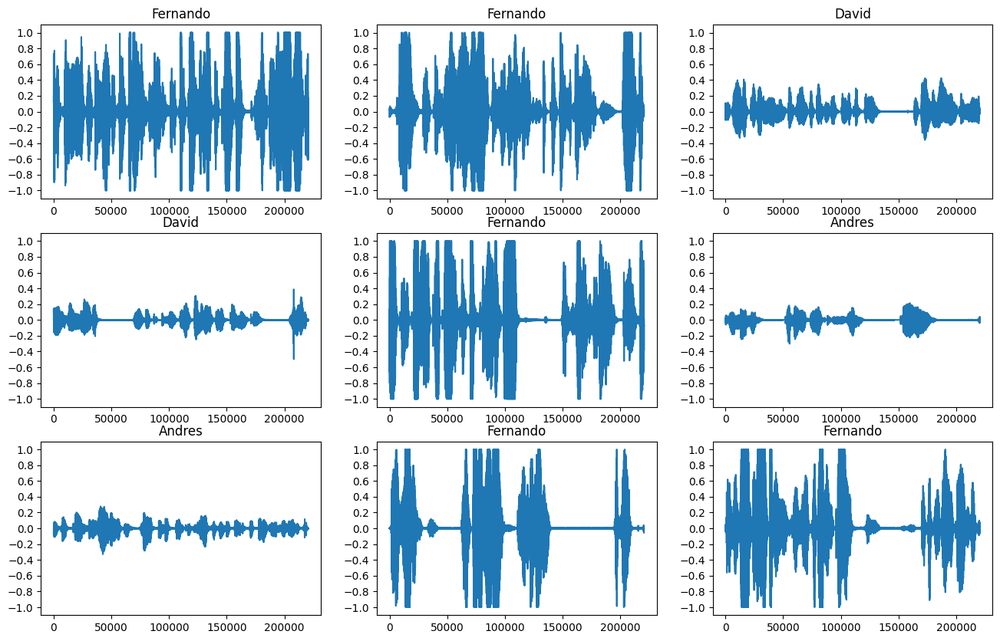

In [12]:
plt.figure(figsize=(16, 10))
rows = 3
cols = 3
n = rows * cols
for i in range(n):
  plt.subplot(rows, cols, i+1)
  audio_signal = example_audio[i]
  plt.plot(audio_signal)
  plt.title(label_names[example_labels[i]])
  plt.yticks(np.arange(-1.2, 1.2, 0.2))
  plt.ylim([-1.1, 1.1])
  display.display(display.Audio(example_audio[i], rate=44100))

### 1.1) Convert waveforms to spectograms
Keep in mind that the CNN model works with spectograms which show frequency changes over time and can be represented as 2D images.
Feed the spectrogram images into your neural network to train the model.

This code defines a function, `get_spectrogram`, which converts audio waveforms into spectrograms. Spectrograms are representations that show how frequencies change over time and can be used as 2D images for training a neural network.

Parameters:
- waveform (Tensor): Audio waveform to be converted into a spectrogram.

Returns:
- spectrogram (Tensor): The spectrogram representation of the audio waveform.

Usage:
1. Import this code snippet to convert audio waveforms into spectrograms.
2. Pass an audio waveform as the 'waveform' parameter to the function.
3. The function uses the Short-Time Fourier Transform (STFT) to compute the spectrogram, takes the magnitude, and adds a 'channels' dimension for compatibility with convolutional neural networks.

This code allows you to convert audio data into spectrogram representations.

Note: Ensure that you have a valid audio waveform as input for the 'waveform' parameter.

In [13]:
# Convert waveforms to spectrograms which show frequency changes over
# time and can be represented as 2D images. 
# You will feed the spectrogram images into your neural network to train the model.

def get_spectrogram(waveform):
  # Convert the waveform to a spectrogram via a STFT.
  spectrogram = tf.signal.stft(waveform, frame_length=256, frame_step=128)
  # Obtain the magnitude of the STFT.
  spectrogram = tf.abs(spectrogram)
  # Add a `channels` dimension, so that the spectrogram can be used
  # as image-like input data with convolution layers (which expect
  # shape (`batch_size`, `height`, `width`, `channels`).
  spectrogram = spectrogram[..., tf.newaxis]
  return spectrogram

### Exploring Data: Printing Shapes and Playing Audio

This code snippet explores the data by printing the shapes of a tensorized waveform, its corresponding spectrogram, and playing the original audio for a few examples.

Parameters:
- example_labels (Tensor): Labels associated with the audio examples.
- example_audio (Tensor): Audio samples to be explored.
- label_names (numpy.ndarray): An array containing the label names.

Usage:
1. Import this code snippet to explore the data by printing shapes and playing audio.
2. Ensure that you have valid 'example_labels' and 'example_audio' data, as well as 'label_names' for labels.
3. The code iterates through a few examples, printing shapes and playing the original audio.

This code helps you explore the data by displaying shapes and playing audio for a few examples.

Note: Ensure that you have valid data for 'example_labels' and 'example_audio' to explore.

In [14]:
# Next, start exploring the data. Print the shapes of one example's tensorized waveform 
# and the corresponding spectrogram, and play the original audio

for i in range(3):
  label = label_names[example_labels[i]]
  waveform = example_audio[i]
  spectrogram = get_spectrogram(waveform)

  print("Waveform:", waveform)
  print('Label:', label)
  print('Waveform shape:', waveform.shape)
  print('Spectrogram shape:', spectrogram.shape)
  print('Audio playback')
  display.display(display.Audio(waveform, rate=44100))

Waveform: tf.Tensor(
[ 0.18786621  0.17608643  0.16500854 ... -0.0614624  -0.06027222
 -0.06011963], shape=(220500,), dtype=float32)
Label: Fernando
Waveform shape: (220500,)
Spectrogram shape: (1721, 129, 1)
Audio playback


Waveform: tf.Tensor(
[-0.07025146 -0.07028198 -0.07025146 ...  0.00756836  0.00048828
 -0.01193237], shape=(220500,), dtype=float32)
Label: Fernando
Waveform shape: (220500,)
Spectrogram shape: (1721, 129, 1)
Audio playback


Waveform: tf.Tensor(
[-0.06488037 -0.04571533  0.02127075 ... -0.0093689  -0.00994873
 -0.01193237], shape=(220500,), dtype=float32)
Label: David
Waveform shape: (220500,)
Spectrogram shape: (1721, 129, 1)
Audio playback


### Defining a Function to Display a Spectrogram

This code snippet defines a function, `plot_spectrogram`, that is used to display a spectrogram. The function takes a spectrogram as input and creates a graphical representation of it.

Parameters:
- spectrogram (numpy.ndarray): The spectrogram to be displayed.
- ax (matplotlib.axes.Axes): The matplotlib axes where the spectrogram will be plotted.

Usage:
1. Import this code snippet to define a function for displaying a spectrogram.
2. Provide the spectrogram and a matplotlib axes ('ax') as input parameters to the function.
3. The function converts the spectrogram to a log scale, transposes it, and creates a colormap representation.

This code allows you to create a graphical representation of a spectrogram.

Note: Make sure to have a valid spectrogram and matplotlib axes for plotting.

In [15]:
# Now, define a function for displaying a spectrogram:

def plot_spectrogram(spectrogram, ax):
  if len(spectrogram.shape) > 2:
    assert len(spectrogram.shape) == 3
    spectrogram = np.squeeze(spectrogram, axis=-1)
  # Convert the frequencies to log scale and transpose, so that the time is
  # represented on the x-axis (columns).
  # Add an epsilon to avoid taking a log of zero.
  log_spec = np.log(spectrogram.T + np.finfo(float).eps)
  height = log_spec.shape[0]
  width = log_spec.shape[1]
  X = np.linspace(0, np.size(spectrogram), num=width, dtype=int)
  Y = range(height)
  ax.pcolormesh(X, Y, log_spec)

### Plotting Waveform and Spectrogram

This code snippet creates a plot that displays the waveform of an example over time and the corresponding spectrogram (frequencies over time).

Parameters:
- waveform (Tensor): Audio waveform to be plotted.
- spectrogram (Tensor): Spectrogram corresponding to the waveform.
- label (str): The label associated with the example.

Usage:
1. Import this code snippet to create a plot of the waveform and spectrogram.
2. Provide the waveform, spectrogram, and label as input parameters to the code.
3. The code generates a plot with two subplots: one for the waveform and one for the spectrogram.

This code is used to visualize the waveform and spectrogram for a specific example.

Note: Ensure that you have valid waveform, spectrogram, and label data before creating the plot.

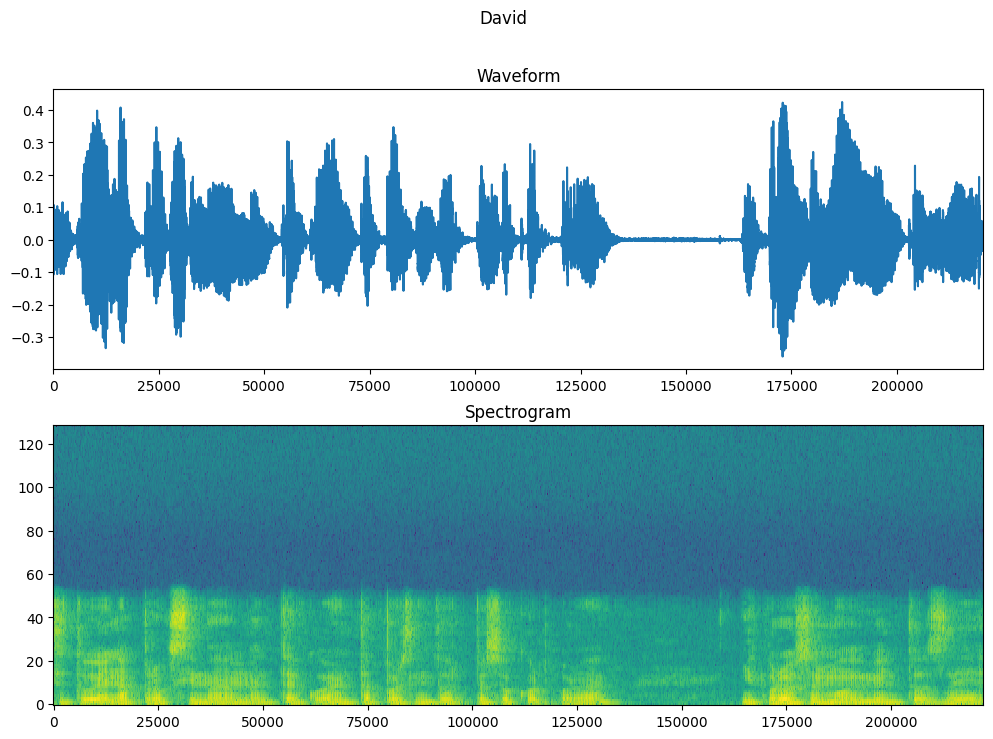

In [16]:
# Plot the example's waveform over time and the corresponding spectrogram 
# (frequencies over time):

fig, axes = plt.subplots(2, figsize=(12, 8))
timescale = np.arange(waveform.shape[0])
axes[0].plot(timescale, waveform.numpy())
axes[0].set_title('Waveform')
axes[0].set_xlim([0, 220500])

plot_spectrogram(spectrogram.numpy(), axes[1])
axes[1].set_title('Spectrogram')
plt.suptitle(label.title())
plt.show()

### Creating Spectrogram Datasets from Audio Datasets

This code snippet defines a function, `make_spec_ds`, that is used to create spectrogram datasets from audio datasets. The function maps each audio sample to its corresponding spectrogram while preserving the associated labels.

Parameters:
- ds (tf.data.Dataset): The input audio dataset.

Returns:
- spec_ds (tf.data.Dataset): The dataset of spectrograms.

Usage:
1. Import this code snippet to create spectrogram datasets from audio datasets.
2. Provide an audio dataset (ds) as the input parameter to the function.
3. The function maps each audio sample to its spectrogram representation and maintains the labels.

This code allows you to create a dataset of spectrograms from an audio dataset.

Note: Ensure that you have a valid audio dataset (val_ds in this case) before creating the spectrogram dataset.

In [17]:
# Now, create spectogram datasets from the audio datasets:

def make_spec_ds(ds):
  return ds.map(
      map_func=lambda audio,label: (get_spectrogram(audio), label),
      num_parallel_calls=tf.data.AUTOTUNE)

#train_spectrogram_ds = make_spec_ds(train_ds)
val_spectrogram_ds = make_spec_ds(val_ds)
#test_spectrogram_ds = make_spec_ds(test_ds)

### Examining Spectrograms in the Dataset

This code snippet is used to examine the spectrograms for different examples in the spectrogram dataset. It retrieves a batch of spectrograms and their corresponding labels from the dataset for inspection.

Parameters:
- val_spectrogram_ds (tf.data.Dataset): The dataset of spectrograms.

Usage:
1. Import this code snippet to examine the spectrograms in the dataset.
2. Ensure that you have created the spectrogram dataset (val_spectrogram_ds) as described in previous code snippets.

This code allows you to inspect the spectrograms in the dataset.

Note: Make sure you have a valid spectrogram dataset (val_spectrogram_ds) before running this code.

In [18]:
# Examine the spectrograms for different examples of the dataset:
for example_spectrograms, example_spect_labels in val_spectrogram_ds.take(1):
  break


### Plotting Spectrograms of Dataset Examples

This code snippet creates a plot to display spectrograms of multiple examples from the spectrogram dataset. Spectrograms are arranged in a grid with rows and columns, and the corresponding label names are shown.

Parameters:
- example_spectrograms (Tensor): Spectrogram data for multiple examples.
- example_spect_labels (Tensor): Labels associated with the examples.
- label_names (numpy.ndarray): An array containing the label names.

Usage:
1. Import this code snippet to plot spectrograms of dataset examples.
2. Ensure that you have valid 'example_spectrograms' and 'example_spect_labels' data, as well as 'label_names' for labels.
3. Customize the number of rows and columns for the layout.
 
 This code is used to visualize the spectrograms of multiple dataset examples in a grid layout.

Note: Ensure that you have valid data for 'example_spectrograms,' 'example_spect_labels,' and 'label_names' before creating the plot.

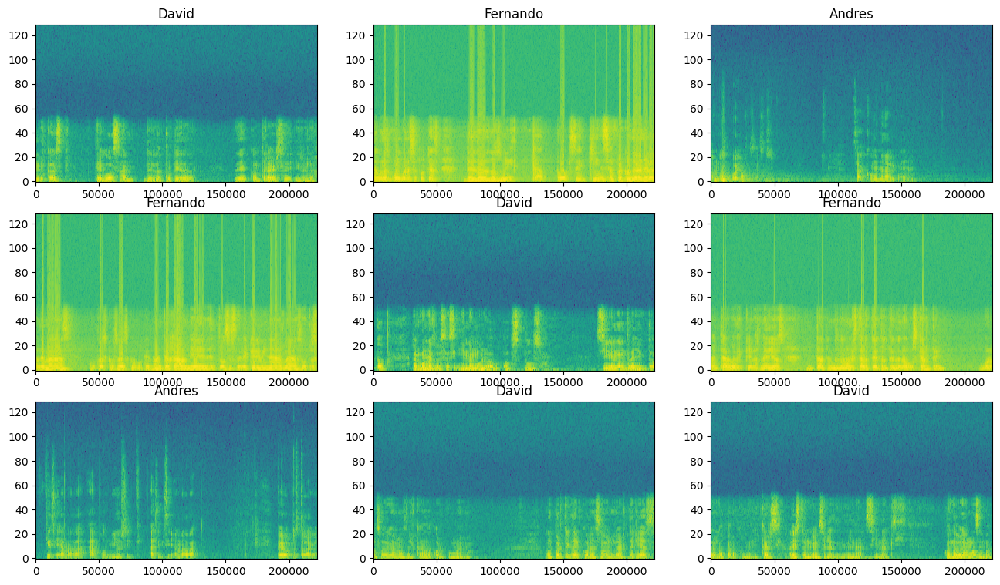

In [19]:
rows = 3
cols = 3
n = rows*cols
fig, axes = plt.subplots(rows, cols, figsize=(16, 9))

for i in range(n):
    r = i // cols
    c = i % cols
    ax = axes[r][c]
    plot_spectrogram(example_spectrograms[i].numpy(), ax)
    ax.set_title(label_names[example_spect_labels[i].numpy()])

plt.show()

### 1.2) Build the model
#### Add Dataset.cache and Dataset.prefetch operations to reduce read latency while training the model: For the model, you'll use a simple convolutional neural network (CNN), since you have transformed the audio files into spectrogram images
#### As elements are drawn from the buffer, new elements from the dataset are loaded into the buffer to replace them. This process continues until all elements from the dataset have been included in the shuffle buffer and processed.

####  A larger buffer size will result in a more thorough shuffling of the data, but it will also require more memory. A smaller buffer size may be less memory-intensive but could result in less effective shuffling

#### The model will use following Keras preprocessing layers

In [20]:
val_spectrogram_ds = val_spectrogram_ds.cache().prefetch(tf.data.AUTOTUNE)

#### - tf.keras.layers.Resizing: to downsample the input to enable the model to train faster.
#### - tf.keras.layers.Normalization: to normalize each pixel in the image based on its mean and standard deviation.

#### For the Normalization layer, its adapt method would first need to be called on the training data in order to compute aggregate statistics (that is, the mean and the standard deviation)

In [21]:
input_shape = example_spectrograms.shape[1:]
print('Input shape:', input_shape)
num_labels = len(label_names)

# Instantiate the `tf.keras.layers.Normalization` layer.
norm_layer = layers.Normalization()
# Fit the state of the layer to the spectrograms
# with `Normalization.adapt`.
norm_layer.adapt(data=val_spectrogram_ds.map(map_func=lambda spec, label: spec))

model = models.Sequential([
    layers.Input(shape=input_shape),
    # Downsample the input.
    layers.Resizing(32, 32),
    # Normalize.
    norm_layer,
    layers.Conv2D(32, 3, activation='relu'),
    layers.Conv2D(64, 3, activation='relu'),
    layers.MaxPooling2D(),
    layers.Dropout(0.25),
    layers.Flatten(),
    layers.Dense(128, activation='relu'),
    layers.Dropout(0.5),
    layers.Dense(num_labels),
])

model.summary()

Input shape: (1721, 129, 1)
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resizing (Resizing)         (None, 32, 32, 1)         0         
                                                                 
 normalization (Normalizati  (None, 32, 32, 1)         3         
 on)                                                             
                                                                 
 conv2d (Conv2D)             (None, 30, 30, 32)        320       
                                                                 
 conv2d_1 (Conv2D)           (None, 28, 28, 64)        18496     
                                                                 
 max_pooling2d (MaxPooling2  (None, 14, 14, 64)        0         
 D)                                                              
                                                                 
 dropout (Dropout)          

#### Configure the Keras model with the Adam optimizer and the cross-entropy loss:



### Compiling a Neural Network Model

This code snippet compiles a neural network model using TensorFlow and Keras. Compilation involves defining the loss function, optimizer, and metrics to be used during training.

Parameters:
- optimizer (tf.keras.optimizers.Optimizer): The optimizer for updating model weights.
- loss (tf.keras.losses.Loss): The loss function to measure the model's performance.
- metrics (list of str): The metrics to track during training (e.g., accuracy).

Usage:
1. Import this code snippet to compile a neural network model.
2. Provide the appropriate optimizer, loss function, and metrics as parameters to the `model.compile` method.


In [22]:
model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001),
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
    metrics=['accuracy'],
)

### 1.3) Evaluate the model pretrained

#### Run the model on the test set and check the model's performance:

This code snippet is used to evaluate a neural network model on the spectrogram dataset using the `model.evaluate()` method. It provides the dataset 'val_spectrogram_ds' as input to assess the model's performance. The parameter 'return_dict=True' specifies that you want to receive evaluation metrics in the form of a dictionary.

Parameters:
- val_spectrogram_ds (tf.data.Dataset): The dataset of spectrograms for evaluation.


In [23]:
# Divided into directories this way, you can easily load the data using:
# keras.utils.audio_dataset_from_directory.

model.evaluate(val_spectrogram_ds, return_dict=True)

9/9 [==============================] - 1s 90ms/step - loss: 1.1019 - accuracy: 0.1301


{'loss': 1.1018842458724976, 'accuracy': 0.13005273044109344}

#### Display a confusion matrix

Use a confusion matrix to check how well the model did classifying each of the commands in the test set:

In [24]:
y_pred = model.predict(val_spectrogram_ds)

9/9 [==============================] - 1s 108ms/step


### Calculating Predicted Labels from Model Predictions

This code snippet is used to calculate the predicted labels (classes) from the prediction outputs 'y_pred' of the model. The result is a tensor containing the predicted labels for each example in the dataset. The 'tf.argmax' function is used to find the class with the maximum value in the prediction outputs along axis 1, which corresponds to the predicted classes.


In [25]:
y_pred = tf.argmax(y_pred, axis=1)

### Obtaining True Labels from a Dataset and Concatenating

This code snippet is used to retrieve the true labels (ground truth) from the spectrogram dataset and concatenate them into a single tensor. The code utilizes the dataset 'val_spectrogram_ds' and applies a mapping function to extract labels from each sample. Subsequently, the labels are concatenated along the specified axis into the 'y_true' tensor.


In [26]:
y_true = tf.concat(list(val_spectrogram_ds.map(lambda s,lab: lab)), axis=0)

### Calculating and Visualizing a Confusion Matrix

This code snippet is used to calculate and visualize a confusion matrix based on the true labels ('y_true') and the predicted labels ('y_pred'). The confusion matrix shows how predictions compare to true labels for each class in a heatmap format.

Parameters:
- y_true (tf.Tensor): The true labels (ground truth).
- y_pred (tf.Tensor): The predicted labels.

Usage:
1. Import this code snippet to calculate and visualize a confusion matrix.
2. Ensure that you have true labels ('y_true') and predicted labels ('y_pred') obtained from your model.
3. Call 'tf.math.confusion_matrix' with true and predicted labels, and then use 'sns.heatmap' to display the confusion matrix.


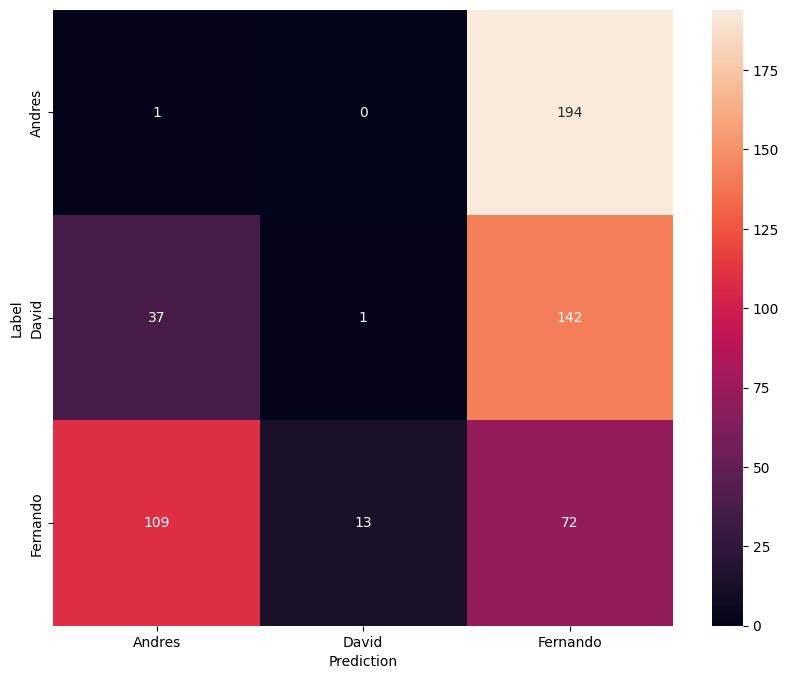

In [27]:
confusion_mtx = tf.math.confusion_matrix(y_true, y_pred)
plt.figure(figsize=(10, 8))
sns.heatmap(confusion_mtx,
            xticklabels=label_names,
            yticklabels=label_names,
            annot=True, fmt='g')
plt.xlabel('Prediction')
plt.ylabel('Label')
plt.show()

#### Run inference on an audio file

#### Finally, verify the model's prediction output using an input audio file of someone saying "no". How well does your model perform?

### Performing Inference on a Specific Audio Example

This code snippet is used to perform inference on a specific audio example using a pre-trained model. It loads an audio file, processes it, and makes predictions using the model. The predictions are then visualized in a bar chart along with the audio waveform.

Parameters:
- x (tf.Tensor): The audio example in spectrogram format.
- sample_rate (int): The sample rate of the audio.
- model (tf.keras.Model): The pre-trained neural network model.

Usage:
1. Import this code snippet to perform inference on a specific audio example.
2. Ensure that you have a valid audio example ('x'), its sample rate ('sample_rate'), and a pre-trained model ('model').
3. Customize 'x_labels' for class labels as needed.

This code is used to perform inference on a specific audio example and visualize the predictions along with the audio waveform.

Note: Ensure that you have a valid audio example, its sample rate, and a pre-trained model before using this code. Customize the 'x_labels' to match your class labels.

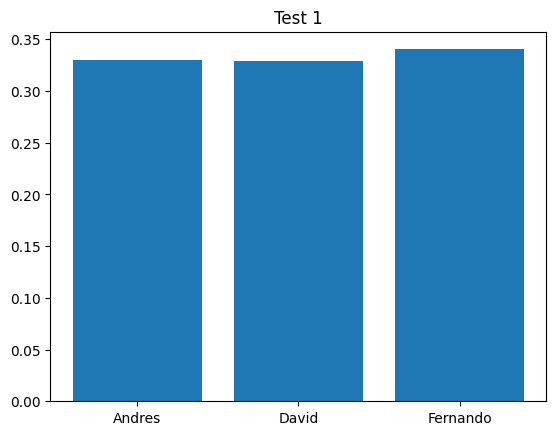

In [28]:
from pathlib import Path
x = "/Users/cabral/voices_dataset/Andres/output_segment_2.wav"
x = tf.io.read_file(str(x))
x, sample_rate = tf.audio.decode_wav(x, desired_channels=1, desired_samples=220500,)
x = tf.squeeze(x, axis=-1)
waveform = x
x = get_spectrogram(x)
x = x[tf.newaxis,...]

prediction = model(x)
x_labels = ['Andres', 'David', 'Fernando']
plt.bar(x_labels, tf.nn.softmax(prediction[0]))
plt.title('Test 1')
plt.show()

display.display(display.Audio(waveform, rate=44100))

As the output suggests, your model should have recognized the audio command as "no".

Export the model with preprocessing

The model's not very easy to use if you have to apply those preprocessing steps before passing data to the model for inference. So build an end-to-end version:

### Creating an ExportModel for Inference

This code defines a class 'ExportModel' that is used to create an inference API for a pre-trained model. The class accepts both an audio file name in string format and a batch of audio waveforms in float number format. It uses TensorFlow to load and process audio files and make predictions using the model.

Parameters:
- model (tf.keras.Model): The pre-trained neural network model.

Usage:
1. Import this code to create an ExportModel for inference.
2. Ensure that you have a valid pre-trained model ('model') and have defined 'get_spectrogram' and 'label_names' as required.
3. Use the ExportModel to perform inference on audio data.

This code creates an ExportModel class to simplify inference using a pre-trained model.

Note: Ensure that you have a valid pre-trained model and have defined the 'get_spectrogram' function and 'label_names' as needed.

In [29]:
class ExportModel(tf.Module):
  def __init__(self, model):
    self.model = model

    # Accept either a string-filename or a batch of waveforms.
    # YOu could add additional signatures for a single wave, or a ragged-batch. 
    self.__call__.get_concrete_function(
        x=tf.TensorSpec(shape=(), dtype=tf.string))
    self.__call__.get_concrete_function(
       x=tf.TensorSpec(shape=[None, 220500], dtype=tf.float32))


  @tf.function
  def __call__(self, x):
    # If they pass a string, load the file and decode it. 
    if x.dtype == tf.string:
      x = tf.io.read_file(x)
      x, _ = tf.audio.decode_wav(x, desired_channels=1, desired_samples=220500,)
      x = tf.squeeze(x, axis=-1)
      x = x[tf.newaxis, :]

    x = get_spectrogram(x)  
    result = self.model(x, training=False)

    class_ids = tf.argmax(result, axis=-1)
    class_names = tf.gather(label_names, class_ids)
    return {'predictions':result,
            'class_ids': class_ids,
            'class_names': class_names}

### ExportModel

This code snippet creates an instance of the 'ExportModel' class named 'export' and uses it to perform inference on a specific audio file. The audio file is loaded, processed, and a prediction is made using the model.

Parameters:
- export (ExportModel): An instance of the 'ExportModel' class.
- audio_file (str): The path to the audio file for which you want to make predictions.

Usage:
1. Import this code snippet to perform inference using the ExportModel.
2. Ensure that you have created an 'ExportModel' instance ('export') with a valid pre-trained model and defined 'get_spectrogram' and 'label_names' as required.
3. Provide the path to the audio file as 'audio_file' to perform inference.


In [30]:
export = ExportModel(model)
export(tf.constant(str("/Users/cabral/voices_dataset/David/output_segment_283.wav")))

{'predictions': <tf.Tensor: shape=(1, 3), dtype=float32, numpy=array([[-0.00581745, -0.00084932,  0.02253889]], dtype=float32)>,
 'class_ids': <tf.Tensor: shape=(1,), dtype=int64, numpy=array([2])>,
 'class_names': <tf.Tensor: shape=(1,), dtype=string, numpy=array([b'Fernando'], dtype=object)>}

Save and reload the model, the reloaded model gives identical output:



# 3) Perform Fine tuning (Transfer Learning)

### Creating Training and Validation Datasets from a Directory

This code snippet is used to create training and validation datasets from a data directory using the 'tf.keras.utils.audio_dataset_from_directory' function. It also defines the labels (class names) based on the created datasets.

Parameters:
- data_dir (pathlib.Path): The path to the data directory containing audio files.
- new_train_ds (tf.data.Dataset): The training dataset.
- new_val_ds (tf.data.Dataset): The validation dataset.

Usage:
1. Import this code snippet to create training and validation datasets from a data directory.
2. Specify the data directory path ('data_dir') and other relevant parameters when calling 'tf.keras.utils.audio_dataset_from_directory'.
3. The 'label_names' variable contains the class names extracted from the dataset.

This code is used to create training and validation datasets from an audio data directory and obtain the class names (labels) used in the dataset.

Note: Ensure that you have a valid data directory and specify the necessary parameters for creating the datasets.

In [44]:
data_dir = pathlib.Path(DATASET_PATH)

new_train_ds, new_val_ds = tf.keras.utils.audio_dataset_from_directory(
    directory=data_dir,
    batch_size=64,
    validation_split=0.2,
    seed=0,
    output_sequence_length=220500,
    subset='both')

label_names = np.array(new_train_ds.class_names)
print()
print("label names:", label_names)


Found 1081 files belonging to 3 classes.
Using 865 files for training.
Using 216 files for validation.

label names: ['Andres' 'David' 'Fernando']


### Creating Training and Validation Datasets from a Directory

This code snippet is used to create training and validation datasets from a data directory using the 'tf.keras.utils.audio_dataset_from_directory' function. It also defines the labels (class names) based on the created datasets.

Parameters:
- data_dir (pathlib.Path): The path to the data directory containing audio files.
- new_train_ds (tf.data.Dataset): The training dataset.
- new_val_ds (tf.data.Dataset): The validation dataset.

Usage:
1. Import this code snippet to create training and validation datasets from a data directory.
2. Specify the data directory path ('data_dir') and other relevant parameters when calling 'tf.keras.utils.audio_dataset_from_directory'.
3. The 'label_names' variable contains the class names extracted from the dataset.

This code is used to create training and validation datasets from an audio data directory and obtain the class names (labels) used in the dataset.

Note: Ensure that you have a valid data directory and specify the necessary parameters for creating the datasets.

In [45]:
new_train_ds.element_spec

new_train_ds = new_train_ds.map(squeeze, tf.data.AUTOTUNE)
new_val_ds = new_val_ds.map(squeeze, tf.data.AUTOTUNE)

new_test_ds = new_val_ds.shard(num_shards=2, index=0)
new_val_ds = new_val_ds.shard(num_shards=2, index=1)

for example_audio, example_labels in new_train_ds.take(1):  
  print(example_audio.shape)
  print(example_labels.shape)
    

for i in range(3):
  label = label_names[example_labels[i]]
  waveform = example_audio[i]
  spectrogram = get_spectrogram(waveform)

print("Spectograms")

new_train_spectrogram_ds = make_spec_ds(new_train_ds)
new_val_spectrogram_ds = make_spec_ds(new_val_ds)
new_test_spectrogram_ds = make_spec_ds(new_test_ds)

for example_spectrograms, example_spect_labels in new_train_spectrogram_ds.take(1):
  break


new_train_spectrogram_ds = new_train_spectrogram_ds.cache().shuffle(10000).prefetch(tf.data.AUTOTUNE)
new_val_spectrogram_ds = new_val_spectrogram_ds.cache().prefetch(tf.data.AUTOTUNE)
new_test_spectrogram_ds = new_test_spectrogram_ds.cache().prefetch(tf.data.AUTOTUNE)
print("Dataset of spectograms created")

(64, 220500)
(64,)
Spectograms
Dataset of spectograms created


### Defining a Fine-Tuned Convolutional Neural Network Model

This code snippet defines a fine-tuned convolutional neural network (CNN) model for audio spectrogram classification. The model consists of convolutional layers, batch normalization, max-pooling layers, dropout layers, and fully connected layers.

Parameters:
- input_shape (tuple): The shape of the input data.
- num_labels (int): The number of output labels (classes).

Usage:
1. Import this code snippet to define a fine-tuned CNN model for audio spectrogram classification.
2. Specify the input shape ('input_shape') and the number of output labels ('num_labels') as required.
3. Customize the model architecture based on your specific needs.

This code defines a fine-tuned CNN model for audio spectrogram classification. You can customize the architecture of the model based on your specific requirements.

The fien tuning process is the following:

Resize the images to 64 by 64. This allows the model to extract more features eventhough the process takes longer
The next process was to stack two max pooling convolutional layers to reduce the spatial dimensions of feature maps. It helps in retaining the most important features while reducing computational complexity.
The strides parameter determines the step size at which the pooling window moves across the feature map. In this case, (2,2) indicates that the pooling window moves by two pixels horizontally and two pixels vertically. This means that the pooling operation does not overlap, and it reduces the size of the feature map by a factor of 2 in both dimensions.
The last modified layer was to lower the dropout rate to randomly deactivates a fraction of the neurons during training. In this case, it will deactivate 15% of the neurons.

Note: Ensure that you have the correct input shape and the number of output labels for your classification task.


In [46]:
input_shape = example_spectrograms.shape[1:]
print('Input shape:', input_shape)
num_labels = len(label_names)

# Instantiate the `tf.keras.layers.Normalization` layer.
norm_layer = layers.Normalization()
# Fit the state of the layer to the spectrograms
# with `Normalization.adapt`.
norm_layer.adapt(data=new_train_spectrogram_ds.map(map_func=lambda spec, label: spec))

fine_tuned_model = models.Sequential([
    layers.Input(shape=input_shape),
    # Downsample the input.
    layers.Resizing(64, 64), #Change resizing from 32 to 64 to make the model detect more features even tho it's slower
    # Normalize.
    norm_layer,
    layers.Conv2D(64, 5, activation='relu'),
    layers.Conv2D(64, 5, activation='relu'), #Stack the 2D conversion layers
    layers.BatchNormalization(), #Normalize the batch
    layers.MaxPooling2D(pool_size=(2,2), strides=(2,2)),
    layers.MaxPooling2D(pool_size=(2,2), strides=(2,2)),

    #layers.AveragePooling2D(pool_size=(2, 2)) # where the average value in each region is taken.
    layers.Dropout(0.15), #Lower dropout rate from .25 to .15
    layers.Flatten(),
    layers.Dense(128, activation='relu'), #layers.Dense(128, activation='relu'),
    layers.Dropout(0.5),
    layers.Dense(num_labels),
])

fine_tuned_model.summary()

Input shape: (1721, 129, 1)


2023-11-08 20:01:45.311323: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:422] ShuffleDatasetV3:88: Filling up shuffle buffer (this may take a while): 6 of 10000
2023-11-08 20:01:51.837572: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:452] Shuffle buffer filled.


Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resizing_2 (Resizing)       (None, 64, 64, 1)         0         
                                                                 
 normalization_2 (Normaliza  (None, 64, 64, 1)         3         
 tion)                                                           
                                                                 
 conv2d_4 (Conv2D)           (None, 60, 60, 64)        1664      
                                                                 
 conv2d_5 (Conv2D)           (None, 56, 56, 64)        102464    
                                                                 
 batch_normalization_1 (Bat  (None, 56, 56, 64)        256       
 chNormalization)                                                
                                                                 
 max_pooling2d_3 (MaxPoolin  (None, 28, 28, 64)       

### Compiling the Fine-Tuned Convolutional Neural Network Model

This code snippet compiles the fine-tuned convolutional neural network (CNN) model for audio spectrogram classification. It specifies the optimizer, loss function, and metrics to be used during training.

Parameters:
- fine_tuned_model (tf.keras.Model): The fine-tuned CNN model.

Usage:
1. Import this code snippet to compile the fine-tuned CNN model for audio spectrogram classification.
2. Ensure that you have defined the 'fine_tuned_model' as required.
3. Customize the optimizer, loss function, and metrics based on your specific task.

This code compiles the fine-tuned CNN model, specifying the Adam optimizer, sparse categorical cross-entropy loss, and accuracy as the metric for training.

Note: Make sure to customize the optimizer, loss function, and metrics according to your specific classification task.

In [47]:
fine_tuned_model.compile(
    optimizer=tf.keras.optimizers.Adam(),
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
    metrics=['accuracy'],
)

### Training the Fine-Tuned Convolutional Neural Network Model

This code snippet trains the fine-tuned convolutional neural network (CNN) model with a specified number of epochs. It uses the training spectrogram dataset and the validation spectrogram dataset for training. Additionally, it employs early stopping as a callback to halt training if there is no improvement in the validation metric after a certain number of epochs.

Parameters:
- fine_tuned_model (tf.keras.Model): The fine-tuned CNN model.
- new_train_spectrogram_ds (tf.data.Dataset): The dataset of training spectrograms.
- new_val_spectrogram_ds (tf.data.Dataset): The dataset of validation spectrograms.
- EPOCHS (int): The number of training epochs.

Usage:
1. Import this code snippet to train the fine-tuned CNN model for audio spectrogram classification.
2. Ensure that you have defined the 'fine_tuned_model,' 'new_train_spectrogram_ds,' 'new_val_spectrogram_ds,' and 'EPOCHS' as required.
3. Customize the training process based on your specific task and requirements.

This code trains the fine-tuned CNN model for a specified number of epochs, using the training and validation spectrogram datasets. Early stopping is employed to prevent overfitting by stopping training if there is no improvement in the validation metric within a specified patience period.

Note: Adjust the number of epochs and other training parameters as needed for your specific task.

In [48]:
print("Train the model with n epochs")
EPOCHS = 10
new_history = fine_tuned_model.fit(
    new_train_spectrogram_ds,
    validation_data=new_val_spectrogram_ds,
    epochs=EPOCHS,
    callbacks=tf.keras.callbacks.EarlyStopping(verbose=1, patience=2),
)

Train the model with n epochs
Epoch 1/10
14/14 [==============================] - 72s 5s/step - loss: 0.9048 - accuracy: 0.7595 - val_loss: 1.3644 - val_accuracy: 0.3750
Epoch 2/10
14/14 [==============================] - 55s 4s/step - loss: 0.1371 - accuracy: 0.9526 - val_loss: 0.9087 - val_accuracy: 0.3977
Epoch 3/10
14/14 [==============================] - 66s 5s/step - loss: 0.0899 - accuracy: 0.9688 - val_loss: 0.7515 - val_accuracy: 0.4205
Epoch 4/10
14/14 [==============================] - 72s 5s/step - loss: 0.0561 - accuracy: 0.9827 - val_loss: 0.5113 - val_accuracy: 0.8409
Epoch 5/10
14/14 [==============================] - 58s 4s/step - loss: 0.0350 - accuracy: 0.9896 - val_loss: 0.3700 - val_accuracy: 0.9886
Epoch 6/10
14/14 [==============================] - 55s 4s/step - loss: 0.0574 - accuracy: 0.9919 - val_loss: 0.4925 - val_accuracy: 0.8636
Epoch 7/10
14/14 [==============================] - 61s 4s/step - loss: 0.0221 - accuracy: 0.9965 - val_loss: 0.3540 - val_accurac

Plotting Training Metrics

This code snippet plots the training metrics, including loss and accuracy, over the course of training epochs. It utilizes the training history information ('new_history') to create graphs of both loss and accuracy for both the training and validation datasets.

Parameters:
- new_history (tf.keras.callbacks.History): The training history containing loss and accuracy information.

Usage:
1. Import this code snippet to visualize the training metrics during model training.
2. Ensure that you have obtained the 'new_history' object as a result of model training.
3. Plot the loss and accuracy trends over epochs to assess the model's performance.

This code generates plots to visualize the training metrics of loss and accuracy over training epochs. It is a useful tool for monitoring the model's performance during training.

Note: Ensure that you have the training history ('new_history') from the model training process.

Text(0, 0.5, 'Accuracy [%]')

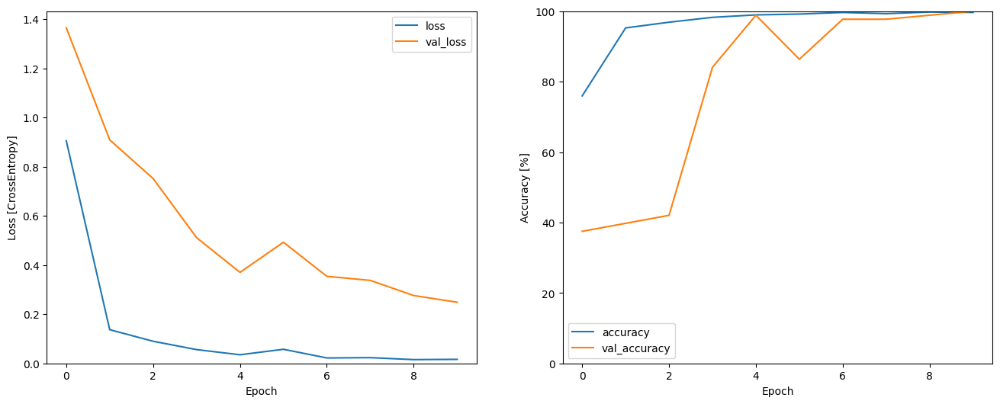

In [49]:
metrics = new_history.history
plt.figure(figsize=(16,6))
plt.subplot(1,2,1)
plt.plot(new_history.epoch, metrics['loss'], metrics['val_loss'])
plt.legend(['loss', 'val_loss'])
plt.ylim([0, max(plt.ylim())])
plt.xlabel('Epoch')
plt.ylabel('Loss [CrossEntropy]')

plt.subplot(1,2,2)
plt.plot(new_history.epoch, 100*np.array(metrics['accuracy']), 100*np.array(metrics['val_accuracy']))
plt.legend(['accuracy', 'val_accuracy'])
plt.ylim([0, 100])
plt.xlabel('Epoch')
plt.ylabel('Accuracy [%]')

### Evaluating the Fine-Tuned Convolutional Neural Network Model

These codes evaluates the fine-tuned convolutional neural network (CNN) model on the test dataset and makes predictions on the test dataset. It also compares the predictions with the true labels to calculate evaluation metrics.

Parameters:
- fine_tuned_model (tf.keras.Model): The fine-tuned CNN model.
- new_test_spectrogram_ds (tf.data.Dataset): The dataset of test spectrograms.

Usage:
1. Import this code snippet to evaluate the fine-tuned CNN model on a test dataset.
2. Ensure that you have the 'fine_tuned_model' and 'new_test_spectrogram_ds' objects defined.
3. Calculate and analyze evaluation metrics, such as accuracy, using the model's predictions and true labels.

This code performs model evaluation by calculating evaluation metrics on the test dataset. It also computes model predictions and compares them with true labels for further analysis.

Note: Ensure that you have defined the 'fine_tuned_model' and 'new_test_spectrogram_ds' objects appropriately for your classification task.

In [50]:
fine_tuned_model.evaluate(new_test_spectrogram_ds, return_dict=True)

2/2 [==============================] - 5s 1s/step - loss: 0.2981 - accuracy: 0.9844


{'loss': 0.29808953404426575, 'accuracy': 0.984375}

In [51]:
y_pred = fine_tuned_model.predict(new_test_spectrogram_ds)

2/2 [==============================] - 2s 1s/step


In [52]:
y_pred = tf.argmax(y_pred, axis=1)

In [53]:
y_true = tf.concat(list(new_test_spectrogram_ds.map(lambda s,lab: lab)), axis=0)

### Generating and Displaying a Confusion Matrix

This code snippet generates and displays a confusion matrix to evaluate the performance of the fine-tuned convolutional neural network (CNN) model in an audio classification task. A confusion matrix provides insights into how the model performs in terms of class classification.

Parameters:
- confusion_mtx (tf.Tensor): The confusion matrix obtained from model predictions.
- label_names (list): A list of label names for the classes.

Usage:
1. Import this code snippet to generate and visualize a confusion matrix for model evaluation.
2. Ensure that you have calculated the 'confusion_mtx' based on model predictions and true labels.
3. Customize the visualization by specifying label names and other parameters as needed.

This code creates a heatmap-based confusion matrix to assess the model's classification performance. It visualizes the relationships between true labels and model predictions, helping you identify any misclassifications.

Note: Ensure that you have defined the confusion matrix ('confusion_mtx') and the label names for your specific classification task.

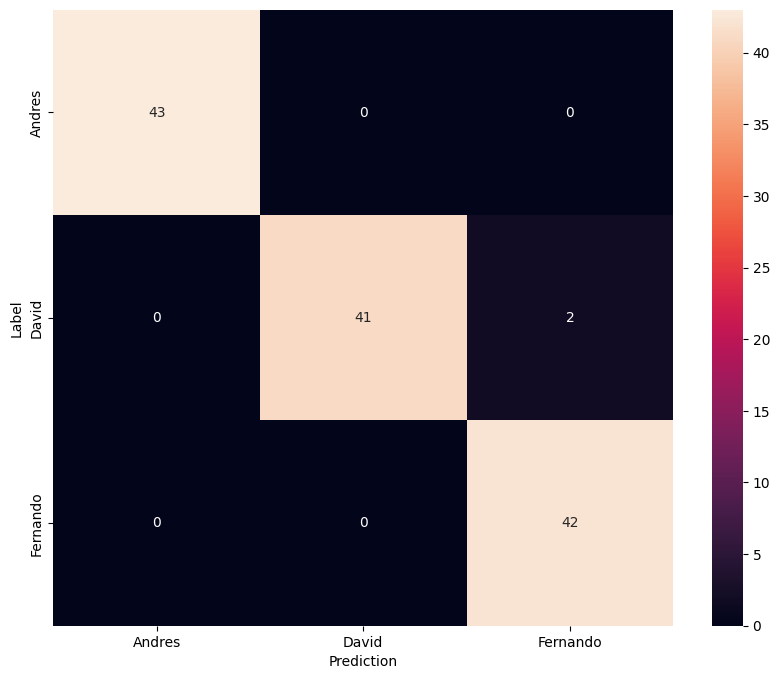

In [54]:
confusion_mtx = tf.math.confusion_matrix(y_true, y_pred)
plt.figure(figsize=(10, 8))
sns.heatmap(confusion_mtx,
            xticklabels=label_names,
            yticklabels=label_names,
            annot=True, fmt='g')
plt.xlabel('Prediction')
plt.ylabel('Label')
plt.show()

### Testing the Fine-Tuned Model with an Audio Sample

This code snippet conducts a test of the fine-tuned convolutional neural network (CNN) model using a specific audio file. It loads an audio file, preprocesses it, makes a prediction with the fine-tuned model, and visualizes the results in the form of a bar chart representing the probabilities of each class. Additionally, it plays the original audio.

Parameters:
- x (tf.Tensor): The audio waveform to be tested.
- sample_rate (int): The sample rate of the audio.
- model (tf.keras.Model): The fine-tuned CNN model.
- x_labels (list): A list of class labels.
- waveform (tf.Tensor): The audio waveform.

Usage:
1. Import this code snippet to test the fine-tuned CNN model on a specific audio sample.
2. Ensure that you have defined the 'x' (audio waveform), 'sample_rate,' 'model,' 'x_labels,' and 'waveform' as required.
3. Customize the audio sample and labels based on your specific testing scenario.

This code is used to test the fine-tuned CNN model on a specific audio sample. It visualizes the model's predictions as a bar chart and allows you to listen to the original audio.

Note: Ensure that you have specified the audio file ('x'), sample rate ('sample_rate'), model ('model'), class labels ('x_labels'), and audio waveform ('waveform') as needed for your testing scenario.

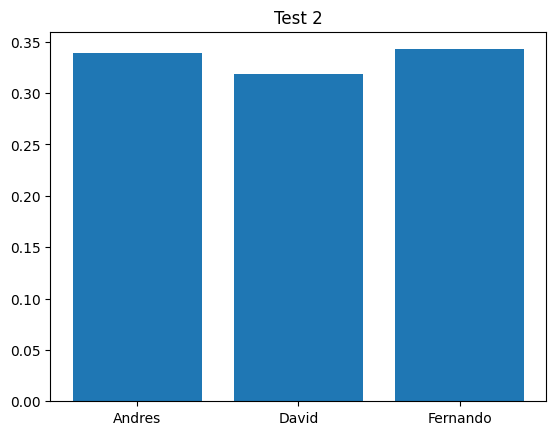

In [55]:
x = "/Users/cabral/voices_dataset/David/output_segment_123.wav"
x = tf.io.read_file(str(x))
x, sample_rate = tf.audio.decode_wav(x, desired_channels=1, desired_samples=220500,)
x = tf.squeeze(x, axis=-1)
waveform = x
x = get_spectrogram(x)
x = x[tf.newaxis,...]

prediction = model(x)
x_labels = ["Andres", "David", "Fernando"]
plt.bar(x_labels, tf.nn.softmax(prediction[0]))
plt.title('Test 2')
plt.show()

display.display(display.Audio(waveform, rate=44100))

# 4) Evaluate the fine tuned model

In [57]:
export = ExportModel(fine_tuned_model)
export(tf.constant(str("/Users/cabral/voices_dataset/Andres/output_segment_2.wav")))

{'predictions': <tf.Tensor: shape=(1, 3), dtype=float32, numpy=array([[ 1.017018  ,  0.08920759, -1.3116539 ]], dtype=float32)>,
 'class_ids': <tf.Tensor: shape=(1,), dtype=int64, numpy=array([0])>,
 'class_names': <tf.Tensor: shape=(1,), dtype=string, numpy=array([b'Andres'], dtype=object)>}